<a href="https://colab.research.google.com/github/temiyemi/visual-web-agent/blob/main/amazon_agent_yolonas.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

[![Roboflow Notebooks](https://media.roboflow.com/notebooks/template/bannertest2-2.png?ik-sdk-version=javascript-1.4.3&updatedAt=1672932710194)](https://github.com/roboflow/notebooks)

# How to Train YOLO-NAS on Custom Dataset

This notebook is based on official [YOLO-NAS Notebook](https://colab.research.google.com/drive/1q0RmeVRzLwRXW-h9dPFSOchwJkThUy6d?usp=sharing) by DECI AI.

![YOLO-NAS on RF100](https://raw.githubusercontent.com/Deci-AI/super-gradients/master/documentation/source/images/yolo_nas_rf100.png)

## ⚠️ Disclaimer

YOLO-NAS is still very fresh. If you notice that our notebook behaves incorrectly - especially if you experience errors that prevent you from going through the tutorial - don't hesitate! Let us know and open an [issue](https://github.com/roboflow/notebooks/issues) on the Roboflow Notebooks repository.

## Pro Tip: Use GPU Acceleration

If you are running this notebook in Google Colab, navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`. This will ensure your notebook uses a GPU, which will significantly speed up model training times.

## Steps in this Tutorial

In this tutorial, we are going to cover:

- Before you start
- Install YOLO-NAS
- Inference with pre-trained COCO model
- Finding open source datasets
- ⭐️ Training YOLO-NAS on your custom dataset ⭐️
- Load trained model
- Evaluate trained model
- Inference with trained model

## 🔥 Let's begin!

## ⚡ Before you start

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [1]:
!nvidia-smi

Fri May 17 10:41:45 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   47C    P8              12W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

## Install YOLO-NAS


In [2]:
!pip install -q git+https://github.com/Deci-AI/super-gradients.git@stable
!pip install -q roboflow
!pip install -q supervision

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


### 🚨 Restart the runtime

**After installation is complete, you'll need to restart the runtime after installation completes. Navigate to `Runtime` -> `Restart runtime` and confirm by clicking `Yes` when you see the popup.**

After that, carry on with the notebook starting from the cell below 👇

**NOTE:** To make it easier for us to manage datasets, images and models we create a `HOME` constant.

In [3]:
import os
HOME = os.getcwd()
print(HOME)

/content


## Inference with pre-trained COCO model

Start by instantiating a pretrained model. YOLO-NAS architecture comes in three different sizes: `yolo_nas_s`, `yolo_nas_m`, `and yolo_nas_l`. We will use `yolo_nas_l` throughout this notebook. Keep in mind that depending on your use-case your decision may be different. Take a peek at the diagram below visualizing the speed-accuracy tradeoff.

<br>

![YOLO-NAS](https://raw.githubusercontent.com/Deci-AI/super-gradients/master/documentation/source/images/yolo_nas_frontier.png)


In [4]:
import torch

DEVICE = 'cuda' if torch.cuda.is_available() else "cpu"
MODEL_ARCH = 'yolo_nas_l'

In [5]:
from super_gradients.training import models

model = models.get(MODEL_ARCH, pretrained_weights="coco").to(DEVICE)

[2024-05-17 10:44:38] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it


The console stream is logged into /root/sg_logs/console.log


[2024-05-17 10:44:46] INFO - utils.py - NumExpr defaulting to 2 threads.
[2024-05-17 10:44:49] INFO - env_sanity_check.py - Library check is not supported when super_gradients installed through "git+https://github.com/..." command
[2024-05-17 10:44:50] WARNING - checkpoint_utils.py - :warning: The pre-trained models provided by SuperGradients may have their own licenses or terms and conditions derived from the dataset used for pre-training.
 It is your responsibility to determine whether you have permission to use the models for your use case.
 The model you have requested was pre-trained on the coco dataset, published under the following terms: https://cocodataset.org/#termsofuse
[2024-05-17 10:44:50] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to compl

### Use Example Data (Below, We'll Prepare Our Own Custom Dataset)

Let's download few example images. Feel free to replace my images with yours. All you have to do is upload them to the `{HOME}/data` directory. If you're looking for data, take a peek at [Roboflow Universe](https://universe.roboflow.com/)! You're sure to find something interesting.

In [6]:
f"{HOME}/data"

'/content/data'

In [ ]:
%cd {HOME}
!mkdir {HOME}/data
%cd {HOME}/data

!wget -q https://media.roboflow.com/notebooks/examples/dog.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-2.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-3.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-4.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-5.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-6.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-7.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-8.jpeg

/content
/content/data


### Single Image Inference

In [ ]:
SOURCE_IMAGE_PATH = f"{HOME}/data/dog-3.jpeg"

In [ ]:
import cv2

image = cv2.imread(SOURCE_IMAGE_PATH)
result = list(model.predict(image, conf=0.35))[0]

[2023-10-10 09:52:14] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


### Output format

For every image YOLO-NAS will produce `ImageDetectionPrediction` object containing the following fields:
- `image` - `numpy.ndarray` - image used for inference
- `class_names` - `List[str]` - list of categories used for training the model
- `prediction` - `DetectionPrediction` - class instance containing detailed informationabout the obtained detections
   - `bboxes_xyxy` - `numpy.ndarray` of `float32` and `(N, 4)` shape - detection bounding boxes in `xyxy` format
   - `confidence` - `numpy.ndarray` of `float32` and `(N,)` shape - confidence value between `0` and `1`
   - `labels` - `numpy.ndarray` of `float32` and `(N,)` shape - `class_id` related to the index in the `class_names` list

In [ ]:
type(result)

super_gradients.training.utils.predict.prediction_results.ImageDetectionPrediction

### Visualize Inference Result

As with other models, you can use Supervision to visualize your results. You can read more about the integration between Supervision and YOLO-NAS [here](https://roboflow.github.io/supervision/detection/core/#supervision.detection.core.Detections.from_yolo_nas), and about visualizing detection [here](https://roboflow.github.io/supervision/detection/annotate/#supervision.detection.annotate.BoxAnnotator.annotate).

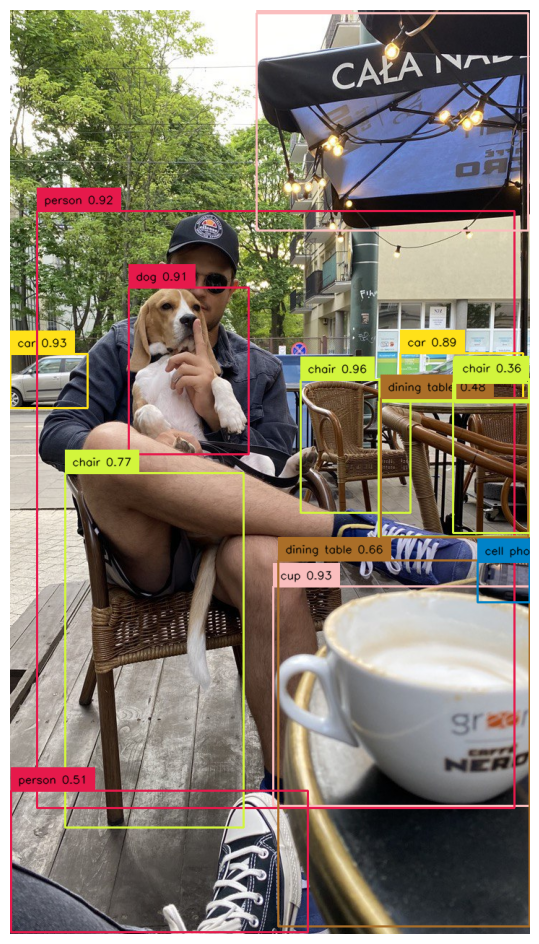

In [ ]:
import supervision as sv

detections = sv.Detections(
    xyxy=result.prediction.bboxes_xyxy,
    confidence=result.prediction.confidence,
    class_id=result.prediction.labels.astype(int)
)

box_annotator = sv.BoxAnnotator()

labels = [
    f"{result.class_names[class_id]} {confidence:0.2f}"
    for _, _, confidence, class_id, _
    in detections
]

annotated_frame = box_annotator.annotate(
    scene=image.copy(),
    detections=detections,
    labels=labels
)

%matplotlib inline
sv.plot_image(annotated_frame, (12, 12))

# Training YOLO-NAS on a Custom Dataset



In [7]:
%cd {HOME}
from google.colab import userdata
from roboflow import Roboflow

ROBOFLOW_API_KEY=userdata.get("ROBOFLOW_API_KEY")

rf = Roboflow(api_key=ROBOFLOW_API_KEY)
project = rf.workspace("fellowshipai-w2w6v").project("amazonwebagent-2")
version = project.version(11)
dataset = version.download("yolov5")

/content
loading Roboflow workspace...
loading Roboflow project...
Exporting format yolov5pytorch in progress : 85.0%
Version export complete for yolov5pytorch format


Extracting Dataset Version Zip to amazonwebagent-2-11 in yolov5pytorch:: 100%|██████████| 164/164 [00:00<00:00, 5802.62it/s]


In [8]:
LOCATION = dataset.location
print("location:", LOCATION)
CLASSES = sorted(project.classes.keys())
print("classes:", CLASSES)

location: /content/amazonwebagent-2-11
classes: ['button', 'clickable', 'productlink', 'searchbar']


## Fine-tune on custom dataset

`ckpt_root_dir` - this is the directory where results from all your experiments will be saved

`experiment_name` - all checkpoints, logs, and tensorboards will be saved in a directory with the name you specify here.

In [9]:
MODEL_ARCH = 'yolo_nas_l'
BATCH_SIZE = 8
MAX_EPOCHS = 25
CHECKPOINT_DIR = f'{HOME}/checkpoints'
EXPERIMENT_NAME = project.name.lower().replace(" ", "_")

In [10]:
from super_gradients.training import Trainer

trainer = Trainer(experiment_name=EXPERIMENT_NAME, ckpt_root_dir=CHECKPOINT_DIR)

In [11]:
dataset_params = {
    'data_dir': LOCATION,
    'train_images_dir':'train/images',
    'train_labels_dir':'train/labels',
    'val_images_dir':'valid/images',
    'val_labels_dir':'valid/labels',
    'test_images_dir':'test/images',
    'test_labels_dir':'test/labels',
    'classes': CLASSES
}

In [12]:
from super_gradients.training.dataloaders.dataloaders import (
    coco_detection_yolo_format_train, coco_detection_yolo_format_val)

train_data = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['train_images_dir'],
        'labels_dir': dataset_params['train_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size': BATCH_SIZE,
        'num_workers': 2
    }
)

val_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['val_images_dir'],
        'labels_dir': dataset_params['val_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size': BATCH_SIZE,
        'num_workers': 2
    }
)

test_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['test_images_dir'],
        'labels_dir': dataset_params['test_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size': BATCH_SIZE,
        'num_workers': 2
    }
)

[2024-05-17 10:51:36] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 66/66 [00:00<00:00, 3106.93it/s]
[2024-05-17 10:51:36] WARNING - detection_dataset.py - Found 1758 invalid bbox that were ignored. For more information, please set `show_all_warnings=True`.
[2024-05-17 10:51:36] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 8/8 [00:00<00:00, 2356.52it/s]
[2024-05-17 10:51:36] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.


**NOTE:** Let's inspect our dataset

In [13]:
train_data.dataset.transforms

### Instantiate the model

In [14]:
from super_gradients.training import models

model = models.get(
    MODEL_ARCH,
    num_classes=len(dataset_params['classes']),
    pretrained_weights="coco"
)

[2024-05-17 10:52:04] WARNING - checkpoint_utils.py - :warning: The pre-trained models provided by SuperGradients may have their own licenses or terms and conditions derived from the dataset used for pre-training.
 It is your responsibility to determine whether you have permission to use the models for your use case.
 The model you have requested was pre-trained on the coco dataset, published under the following terms: https://cocodataset.org/#termsofuse
[2024-05-17 10:52:04] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
[2024-05-17 10:52:04] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_l


### Define metrics and training parameters

In [15]:
from super_gradients.training.losses import PPYoloELoss
from super_gradients.training.metrics import DetectionMetrics_050
from super_gradients.training.models.detection_models.pp_yolo_e import PPYoloEPostPredictionCallback

train_params = {
    'silent_mode': False,
    "average_best_models":True,
    "warmup_mode": "linear_epoch_step",
    "warmup_initial_lr": 1e-6,
    "lr_warmup_epochs": 3,
    "initial_lr": 5e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,
    "optimizer": "Adam",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    "max_epochs": MAX_EPOCHS,
    "mixed_precision": True,
    "loss": PPYoloELoss(
        use_static_assigner=False,
        num_classes=len(dataset_params['classes']),
        reg_max=16
    ),
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            num_cls=len(dataset_params['classes']),
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50'
}

### Train the model

In [16]:
trainer.train(
    model=model,
    training_params=train_params,
    train_loader=train_data,
    valid_loader=val_data
)

[2024-05-17 10:52:39] INFO - sg_trainer.py - Starting a new run with `run_id=RUN_20240517_105239_945999`
[2024-05-17 10:52:39] INFO - sg_trainer.py - Checkpoints directory: /content/checkpoints/amazonwebagent-2/RUN_20240517_105239_945999
[2024-05-17 10:52:39] INFO - sg_trainer.py - Using EMA with params {'decay': 0.9, 'decay_type': 'threshold'}
Object name `linear_epoch_step` is now deprecated. Please replace it with `LinearEpochLRWarmup`.
initialize_param_groups and update_param_groups usages are deprecated since 3.4.0, will be removed in 3.5.0 and have no effect. 
 Assign different learning rates by passing a mapping of layer name prefixes to lr values through initial_lr training hyperparameter (i.e initial_lr={'backbone': 0.01, 'default':0.1})
os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.


The console stream is now moved to /content/checkpoints/amazonwebagent-2/RUN_20240517_105239_945999/console_May17_10_52_39.txt


[2024-05-17 10:52:44] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Single GPU
    - Number of GPUs:               1          (1 available on the machine)
    - Full dataset size:            65         (len(train_set))
    - Batch size per GPU:           8          (batch_size)
    - Batch Accumulate:             1          (batch_accumulate)
    - Total batch size:             8          (num_gpus * batch_size)
    - Effective Batch size:         8          (num_gpus * batch_size * batch_accumulate)
    - Iterations per epoch:         8          (len(train_loader))
    - Gradient updates per epoch:   8          (len(train_loader) / batch_accumulate)
    - Model: YoloNAS_L  (66.91M parameters, 66.91M optimized)
    - Learning Rates and Weight Decays:
      - default: (66.91M parameters). LR: 0.0005 (66.91M parameters) WD: 0.0, (84.70K parameters), WD: 0.0001, (66.82M parameters)

[2024-05-17 10:52:44] INFO - sg_trainer.py - Started training for 2

SUMMARY OF EPOCH 0
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.9392
│   ├── Ppyoloeloss/loss_iou = 1.041
│   ├── Ppyoloeloss/loss_dfl = 0.8706
│   └── Ppyoloeloss/loss = 3.8508
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.8683
    ├── Ppyoloeloss/loss_iou = 1.2235
    ├── Ppyoloeloss/loss_dfl = 0.9015
    ├── Ppyoloeloss/loss = 3.9934
    ├── Precision@0.50 = 0.0
    ├── Recall@0.50 = 0.0
    ├── Map@0.50 = 0.0
    ├── F1@0.50 = 0.0
    └── Best_score_threshold = 0.0



Validating epoch 1: 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]
[2024-05-17 10:53:37] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/amazonwebagent-2/RUN_20240517_105239_945999/ckpt_best.pth
[2024-05-17 10:53:37] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.3016340136528015


SUMMARY OF EPOCH 1
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.8435
│   │   ├── Epoch N-1      = 1.9392 (↘ -0.0957)
│   │   └── Best until now = 1.9392 (↘ -0.0957)
│   ├── Ppyoloeloss/loss_iou = 0.8361
│   │   ├── Epoch N-1      = 1.041  (↘ -0.2049)
│   │   └── Best until now = 1.041  (↘ -0.2049)
│   ├── Ppyoloeloss/loss_dfl = 0.7338
│   │   ├── Epoch N-1      = 0.8706 (↘ -0.1368)
│   │   └── Best until now = 0.8706 (↘ -0.1368)
│   └── Ppyoloeloss/loss = 3.4134
│       ├── Epoch N-1      = 3.8508 (↘ -0.4374)
│       └── Best until now = 3.8508 (↘ -0.4374)
└── Validation
    ├── Ppyoloeloss/loss_cls = 2.4246
    │   ├── Epoch N-1      = 1.8683 (↗ 0.5563)
    │   └── Best until now = 1.8683 (↗ 0.5563)
    ├── Ppyoloeloss/loss_iou = 1.0381
    │   ├── Epoch N-1      = 1.2235 (↘ -0.1854)
    │   └── Best until now = 1.2235 (↘ -0.1854)
    ├── Ppyoloeloss/loss_dfl = 0.7978
    │   ├── Epoch N-1      = 0.9015 (↘ -0.1037)
    │   └── Best until now = 0.9015 (↘ -0.1037)
    ├── Ppyoloeloss/loss

Validating epoch 2: 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]


SUMMARY OF EPOCH 2
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.3832
│   │   ├── Epoch N-1      = 1.8435 (↘ -0.4603)
│   │   └── Best until now = 1.8435 (↘ -0.4603)
│   ├── Ppyoloeloss/loss_iou = 0.7556
│   │   ├── Epoch N-1      = 0.8361 (↘ -0.0805)
│   │   └── Best until now = 0.8361 (↘ -0.0805)
│   ├── Ppyoloeloss/loss_dfl = 0.6302
│   │   ├── Epoch N-1      = 0.7338 (↘ -0.1036)
│   │   └── Best until now = 0.7338 (↘ -0.1036)
│   └── Ppyoloeloss/loss = 2.7691
│       ├── Epoch N-1      = 3.4134 (↘ -0.6443)
│       └── Best until now = 3.4134 (↘ -0.6443)
└── Validation
    ├── Ppyoloeloss/loss_cls = 3.8021
    │   ├── Epoch N-1      = 2.4246 (↗ 1.3775)
    │   └── Best until now = 1.8683 (↗ 1.9337)
    ├── Ppyoloeloss/loss_iou = 1.0822
    │   ├── Epoch N-1      = 1.0381 (↗ 0.0442)
    │   └── Best until now = 1.0381 (↗ 0.0442)
    ├── Ppyoloeloss/loss_dfl = 0.8469
    │   ├── Epoch N-1      = 0.7978 (↗ 0.0491)
    │   └── Best until now = 0.7978 (↗ 0.0491)
    ├── Ppyoloeloss/loss = 5

Validating epoch 3: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


SUMMARY OF EPOCH 3
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.2333
│   │   ├── Epoch N-1      = 1.3832 (↘ -0.15)
│   │   └── Best until now = 1.3832 (↘ -0.15)
│   ├── Ppyoloeloss/loss_iou = 0.7213
│   │   ├── Epoch N-1      = 0.7556 (↘ -0.0343)
│   │   └── Best until now = 0.7556 (↘ -0.0343)
│   ├── Ppyoloeloss/loss_dfl = 0.6242
│   │   ├── Epoch N-1      = 0.6302 (↘ -0.0061)
│   │   └── Best until now = 0.6302 (↘ -0.0061)
│   └── Ppyoloeloss/loss = 2.5788
│       ├── Epoch N-1      = 2.7691 (↘ -0.1903)
│       └── Best until now = 2.7691 (↘ -0.1903)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.9746
    │   ├── Epoch N-1      = 3.8021 (↘ -1.8275)
    │   └── Best until now = 1.8683 (↗ 0.1062)
    ├── Ppyoloeloss/loss_iou = 1.2897
    │   ├── Epoch N-1      = 1.0822 (↗ 0.2075)
    │   └── Best until now = 1.0381 (↗ 0.2516)
    ├── Ppyoloeloss/loss_dfl = 1.1289
    │   ├── Epoch N-1      = 0.8469 (↗ 0.282)
    │   └── Best until now = 0.7978 (↗ 0.3311)
    ├── Ppyoloeloss/loss = 4.393

Validating epoch 4: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


SUMMARY OF EPOCH 4
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1721
│   │   ├── Epoch N-1      = 1.2333 (↘ -0.0612)
│   │   └── Best until now = 1.2333 (↘ -0.0612)
│   ├── Ppyoloeloss/loss_iou = 0.6744
│   │   ├── Epoch N-1      = 0.7213 (↘ -0.0469)
│   │   └── Best until now = 0.7213 (↘ -0.0469)
│   ├── Ppyoloeloss/loss_dfl = 0.5942
│   │   ├── Epoch N-1      = 0.6242 (↘ -0.03)
│   │   └── Best until now = 0.6242 (↘ -0.03)
│   └── Ppyoloeloss/loss = 2.4407
│       ├── Epoch N-1      = 2.5788 (↘ -0.1381)
│       └── Best until now = 2.5788 (↘ -0.1381)
└── Validation
    ├── Ppyoloeloss/loss_cls = 2.6646
    │   ├── Epoch N-1      = 1.9746 (↗ 0.6901)
    │   └── Best until now = 1.8683 (↗ 0.7963)
    ├── Ppyoloeloss/loss_iou = 1.3549
    │   ├── Epoch N-1      = 1.2897 (↗ 0.0652)
    │   └── Best until now = 1.0381 (↗ 0.3168)
    ├── Ppyoloeloss/loss_dfl = 1.0398
    │   ├── Epoch N-1      = 1.1289 (↘ -0.0891)
    │   └── Best until now = 0.7978 (↗ 0.242)
    ├── Ppyoloeloss/loss = 5.059

Validating epoch 5: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


SUMMARY OF EPOCH 5
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1673
│   │   ├── Epoch N-1      = 1.1721 (↘ -0.0048)
│   │   └── Best until now = 1.1721 (↘ -0.0048)
│   ├── Ppyoloeloss/loss_iou = 0.6485
│   │   ├── Epoch N-1      = 0.6744 (↘ -0.0259)
│   │   └── Best until now = 0.6744 (↘ -0.0259)
│   ├── Ppyoloeloss/loss_dfl = 0.5729
│   │   ├── Epoch N-1      = 0.5942 (↘ -0.0213)
│   │   └── Best until now = 0.5942 (↘ -0.0213)
│   └── Ppyoloeloss/loss = 2.3887
│       ├── Epoch N-1      = 2.4407 (↘ -0.052)
│       └── Best until now = 2.4407 (↘ -0.052)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.6364
    │   ├── Epoch N-1      = 2.6646 (↘ -1.0282)
    │   └── Best until now = 1.8683 (↘ -0.2319)
    ├── Ppyoloeloss/loss_iou = 0.9547
    │   ├── Epoch N-1      = 1.3549 (↘ -0.4002)
    │   └── Best until now = 1.0381 (↘ -0.0834)
    ├── Ppyoloeloss/loss_dfl = 0.7382
    │   ├── Epoch N-1      = 1.0398 (↘ -0.3016)
    │   └── Best until now = 0.7978 (↘ -0.0596)
    ├── Ppyoloeloss/loss

Validating epoch 6: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


SUMMARY OF EPOCH 6
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1609
│   │   ├── Epoch N-1      = 1.1673 (↘ -0.0064)
│   │   └── Best until now = 1.1673 (↘ -0.0064)
│   ├── Ppyoloeloss/loss_iou = 0.636
│   │   ├── Epoch N-1      = 0.6485 (↘ -0.0125)
│   │   └── Best until now = 0.6485 (↘ -0.0125)
│   ├── Ppyoloeloss/loss_dfl = 0.5681
│   │   ├── Epoch N-1      = 0.5729 (↘ -0.0048)
│   │   └── Best until now = 0.5729 (↘ -0.0048)
│   └── Ppyoloeloss/loss = 2.365
│       ├── Epoch N-1      = 2.3887 (↘ -0.0237)
│       └── Best until now = 2.3887 (↘ -0.0237)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.3268
    │   ├── Epoch N-1      = 1.6364 (↘ -0.3096)
    │   └── Best until now = 1.6364 (↘ -0.3096)
    ├── Ppyoloeloss/loss_iou = 0.7632
    │   ├── Epoch N-1      = 0.9547 (↘ -0.1914)
    │   └── Best until now = 0.9547 (↘ -0.1914)
    ├── Ppyoloeloss/loss_dfl = 0.6406
    │   ├── Epoch N-1      = 0.7382 (↘ -0.0977)
    │   └── Best until now = 0.7382 (↘ -0.0977)
    ├── Ppyoloeloss/loss

Validating epoch 7: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]
[2024-05-17 10:56:14] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/amazonwebagent-2/RUN_20240517_105239_945999/ckpt_best.pth
[2024-05-17 10:56:14] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.3168446123600006


SUMMARY OF EPOCH 7
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1057
│   │   ├── Epoch N-1      = 1.1609 (↘ -0.0551)
│   │   └── Best until now = 1.1609 (↘ -0.0551)
│   ├── Ppyoloeloss/loss_iou = 0.6068
│   │   ├── Epoch N-1      = 0.636  (↘ -0.0292)
│   │   └── Best until now = 0.636  (↘ -0.0292)
│   ├── Ppyoloeloss/loss_dfl = 0.5528
│   │   ├── Epoch N-1      = 0.5681 (↘ -0.0153)
│   │   └── Best until now = 0.5681 (↘ -0.0153)
│   └── Ppyoloeloss/loss = 2.2653
│       ├── Epoch N-1      = 2.365  (↘ -0.0997)
│       └── Best until now = 2.365  (↘ -0.0997)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.3241
    │   ├── Epoch N-1      = 1.3268 (↘ -0.0027)
    │   └── Best until now = 1.3268 (↘ -0.0027)
    ├── Ppyoloeloss/loss_iou = 0.6829
    │   ├── Epoch N-1      = 0.7632 (↘ -0.0803)
    │   └── Best until now = 0.7632 (↘ -0.0803)
    ├── Ppyoloeloss/loss_dfl = 0.5654
    │   ├── Epoch N-1      = 0.6406 (↘ -0.0751)
    │   └── Best until now = 0.6406 (↘ -0.0751)
    ├── Ppyoloeloss/lo

Validating epoch 8: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]
[2024-05-17 10:57:34] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/amazonwebagent-2/RUN_20240517_105239_945999/ckpt_best.pth
[2024-05-17 10:57:34] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.39969104528427124


SUMMARY OF EPOCH 8
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0564
│   │   ├── Epoch N-1      = 1.1057 (↘ -0.0493)
│   │   └── Best until now = 1.1057 (↘ -0.0493)
│   ├── Ppyoloeloss/loss_iou = 0.5702
│   │   ├── Epoch N-1      = 0.6068 (↘ -0.0366)
│   │   └── Best until now = 0.6068 (↘ -0.0366)
│   ├── Ppyoloeloss/loss_dfl = 0.532
│   │   ├── Epoch N-1      = 0.5528 (↘ -0.0208)
│   │   └── Best until now = 0.5528 (↘ -0.0208)
│   └── Ppyoloeloss/loss = 2.1586
│       ├── Epoch N-1      = 2.2653 (↘ -0.1067)
│       └── Best until now = 2.2653 (↘ -0.1067)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.2175
    │   ├── Epoch N-1      = 1.3241 (↘ -0.1065)
    │   └── Best until now = 1.3241 (↘ -0.1065)
    ├── Ppyoloeloss/loss_iou = 0.6304
    │   ├── Epoch N-1      = 0.6829 (↘ -0.0525)
    │   └── Best until now = 0.6829 (↘ -0.0525)
    ├── Ppyoloeloss/loss_dfl = 0.5274
    │   ├── Epoch N-1      = 0.5654 (↘ -0.038)
    │   └── Best until now = 0.5654 (↘ -0.038)
    ├── Ppyoloeloss/loss 

Validating epoch 9: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]
[2024-05-17 10:59:11] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/amazonwebagent-2/RUN_20240517_105239_945999/ckpt_best.pth
[2024-05-17 10:59:12] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.5928207635879517


SUMMARY OF EPOCH 9
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0317
│   │   ├── Epoch N-1      = 1.0564 (↘ -0.0248)
│   │   └── Best until now = 1.0564 (↘ -0.0248)
│   ├── Ppyoloeloss/loss_iou = 0.5669
│   │   ├── Epoch N-1      = 0.5702 (↘ -0.0033)
│   │   └── Best until now = 0.5702 (↘ -0.0033)
│   ├── Ppyoloeloss/loss_dfl = 0.4871
│   │   ├── Epoch N-1      = 0.532  (↘ -0.0448)
│   │   └── Best until now = 0.532  (↘ -0.0448)
│   └── Ppyoloeloss/loss = 2.0857
│       ├── Epoch N-1      = 2.1586 (↘ -0.0729)
│       └── Best until now = 2.1586 (↘ -0.0729)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0075
    │   ├── Epoch N-1      = 1.2175 (↘ -0.21)
    │   └── Best until now = 1.2175 (↘ -0.21)
    ├── Ppyoloeloss/loss_iou = 0.5895
    │   ├── Epoch N-1      = 0.6304 (↘ -0.041)
    │   └── Best until now = 0.6304 (↘ -0.041)
    ├── Ppyoloeloss/loss_dfl = 0.5003
    │   ├── Epoch N-1      = 0.5274 (↘ -0.0271)
    │   └── Best until now = 0.5274 (↘ -0.0271)
    ├── Ppyoloeloss/loss = 2

Validating epoch 10: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]
[2024-05-17 11:01:05] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/amazonwebagent-2/RUN_20240517_105239_945999/ckpt_best.pth
[2024-05-17 11:01:05] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.5983618497848511


SUMMARY OF EPOCH 10
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0448
│   │   ├── Epoch N-1      = 1.0317 (↗ 0.0132)
│   │   └── Best until now = 1.0317 (↗ 0.0132)
│   ├── Ppyoloeloss/loss_iou = 0.5388
│   │   ├── Epoch N-1      = 0.5669 (↘ -0.0281)
│   │   └── Best until now = 0.5669 (↘ -0.0281)
│   ├── Ppyoloeloss/loss_dfl = 0.5118
│   │   ├── Epoch N-1      = 0.4871 (↗ 0.0247)
│   │   └── Best until now = 0.4871 (↗ 0.0247)
│   └── Ppyoloeloss/loss = 2.0954
│       ├── Epoch N-1      = 2.0857 (↗ 0.0097)
│       └── Best until now = 2.0857 (↗ 0.0097)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0199
    │   ├── Epoch N-1      = 1.0075 (↗ 0.0124)
    │   └── Best until now = 1.0075 (↗ 0.0124)
    ├── Ppyoloeloss/loss_iou = 0.5748
    │   ├── Epoch N-1      = 0.5895 (↘ -0.0146)
    │   └── Best until now = 0.5895 (↘ -0.0146)
    ├── Ppyoloeloss/loss_dfl = 0.4741
    │   ├── Epoch N-1      = 0.5003 (↘ -0.0262)
    │   └── Best until now = 0.5003 (↘ -0.0262)
    ├── Ppyoloeloss/loss = 2.

Validating epoch 11: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]


SUMMARY OF EPOCH 11
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0548
│   │   ├── Epoch N-1      = 1.0448 (↗ 0.01)
│   │   └── Best until now = 1.0317 (↗ 0.0232)
│   ├── Ppyoloeloss/loss_iou = 0.5327
│   │   ├── Epoch N-1      = 0.5388 (↘ -0.0061)
│   │   └── Best until now = 0.5388 (↘ -0.0061)
│   ├── Ppyoloeloss/loss_dfl = 0.5069
│   │   ├── Epoch N-1      = 0.5118 (↘ -0.0049)
│   │   └── Best until now = 0.4871 (↗ 0.0198)
│   └── Ppyoloeloss/loss = 2.0945
│       ├── Epoch N-1      = 2.0954 (↘ -0.001)
│       └── Best until now = 2.0857 (↗ 0.0088)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.029
    │   ├── Epoch N-1      = 1.0199 (↗ 0.0091)
    │   └── Best until now = 1.0075 (↗ 0.0215)
    ├── Ppyoloeloss/loss_iou = 0.5851
    │   ├── Epoch N-1      = 0.5748 (↗ 0.0102)
    │   └── Best until now = 0.5748 (↗ 0.0102)
    ├── Ppyoloeloss/loss_dfl = 0.4759
    │   ├── Epoch N-1      = 0.4741 (↗ 0.0018)
    │   └── Best until now = 0.4741 (↗ 0.0018)
    ├── Ppyoloeloss/loss = 2.09
   

Validating epoch 12: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]
[2024-05-17 11:04:07] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/amazonwebagent-2/RUN_20240517_105239_945999/ckpt_best.pth
[2024-05-17 11:04:07] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.6401697993278503


SUMMARY OF EPOCH 12
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0352
│   │   ├── Epoch N-1      = 1.0548 (↘ -0.0196)
│   │   └── Best until now = 1.0317 (↗ 0.0035)
│   ├── Ppyoloeloss/loss_iou = 0.5365
│   │   ├── Epoch N-1      = 0.5327 (↗ 0.0038)
│   │   └── Best until now = 0.5327 (↗ 0.0038)
│   ├── Ppyoloeloss/loss_dfl = 0.4968
│   │   ├── Epoch N-1      = 0.5069 (↘ -0.0101)
│   │   └── Best until now = 0.4871 (↗ 0.0097)
│   └── Ppyoloeloss/loss = 2.0685
│       ├── Epoch N-1      = 2.0945 (↘ -0.0259)
│       └── Best until now = 2.0857 (↘ -0.0172)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0154
    │   ├── Epoch N-1      = 1.029  (↘ -0.0136)
    │   └── Best until now = 1.0075 (↗ 0.0079)
    ├── Ppyoloeloss/loss_iou = 0.5611
    │   ├── Epoch N-1      = 0.5851 (↘ -0.024)
    │   └── Best until now = 0.5748 (↘ -0.0137)
    ├── Ppyoloeloss/loss_dfl = 0.4653
    │   ├── Epoch N-1      = 0.4759 (↘ -0.0106)
    │   └── Best until now = 0.4741 (↘ -0.0088)
    ├── Ppyoloeloss/loss = 

Validating epoch 13: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


SUMMARY OF EPOCH 13
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0094
│   │   ├── Epoch N-1      = 1.0352 (↘ -0.0258)
│   │   └── Best until now = 1.0317 (↘ -0.0223)
│   ├── Ppyoloeloss/loss_iou = 0.5127
│   │   ├── Epoch N-1      = 0.5365 (↘ -0.0238)
│   │   └── Best until now = 0.5327 (↘ -0.02)
│   ├── Ppyoloeloss/loss_dfl = 0.4976
│   │   ├── Epoch N-1      = 0.4968 (↗ 0.0008)
│   │   └── Best until now = 0.4871 (↗ 0.0104)
│   └── Ppyoloeloss/loss = 2.0197
│       ├── Epoch N-1      = 2.0685 (↘ -0.0488)
│       └── Best until now = 2.0685 (↘ -0.0488)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0719
    │   ├── Epoch N-1      = 1.0154 (↗ 0.0565)
    │   └── Best until now = 1.0075 (↗ 0.0644)
    ├── Ppyoloeloss/loss_iou = 0.5538
    │   ├── Epoch N-1      = 0.5611 (↘ -0.0073)
    │   └── Best until now = 0.5611 (↘ -0.0073)
    ├── Ppyoloeloss/loss_dfl = 0.4607
    │   ├── Epoch N-1      = 0.4653 (↘ -0.0046)
    │   └── Best until now = 0.4653 (↘ -0.0046)
    ├── Ppyoloeloss/loss = 

Validating epoch 14: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


SUMMARY OF EPOCH 14
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9907
│   │   ├── Epoch N-1      = 1.0094 (↘ -0.0187)
│   │   └── Best until now = 1.0094 (↘ -0.0187)
│   ├── Ppyoloeloss/loss_iou = 0.516
│   │   ├── Epoch N-1      = 0.5127 (↗ 0.0033)
│   │   └── Best until now = 0.5127 (↗ 0.0033)
│   ├── Ppyoloeloss/loss_dfl = 0.4866
│   │   ├── Epoch N-1      = 0.4976 (↘ -0.011)
│   │   └── Best until now = 0.4871 (↘ -0.0005)
│   └── Ppyoloeloss/loss = 1.9933
│       ├── Epoch N-1      = 2.0197 (↘ -0.0264)
│       └── Best until now = 2.0197 (↘ -0.0264)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0968
    │   ├── Epoch N-1      = 1.0719 (↗ 0.0249)
    │   └── Best until now = 1.0075 (↗ 0.0893)
    ├── Ppyoloeloss/loss_iou = 0.5583
    │   ├── Epoch N-1      = 0.5538 (↗ 0.0045)
    │   └── Best until now = 0.5538 (↗ 0.0045)
    ├── Ppyoloeloss/loss_dfl = 0.4581
    │   ├── Epoch N-1      = 0.4607 (↘ -0.0026)
    │   └── Best until now = 0.4607 (↘ -0.0026)
    ├── Ppyoloeloss/loss = 2.

Validating epoch 15: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


SUMMARY OF EPOCH 15
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9706
│   │   ├── Epoch N-1      = 0.9907 (↘ -0.02)
│   │   └── Best until now = 0.9907 (↘ -0.02)
│   ├── Ppyoloeloss/loss_iou = 0.503
│   │   ├── Epoch N-1      = 0.516  (↘ -0.013)
│   │   └── Best until now = 0.5127 (↘ -0.0097)
│   ├── Ppyoloeloss/loss_dfl = 0.481
│   │   ├── Epoch N-1      = 0.4866 (↘ -0.0056)
│   │   └── Best until now = 0.4866 (↘ -0.0056)
│   └── Ppyoloeloss/loss = 1.9546
│       ├── Epoch N-1      = 1.9933 (↘ -0.0387)
│       └── Best until now = 1.9933 (↘ -0.0387)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.1939
    │   ├── Epoch N-1      = 1.0968 (↗ 0.097)
    │   └── Best until now = 1.0075 (↗ 0.1863)
    ├── Ppyoloeloss/loss_iou = 0.553
    │   ├── Epoch N-1      = 0.5583 (↘ -0.0053)
    │   └── Best until now = 0.5538 (↘ -0.0008)
    ├── Ppyoloeloss/loss_dfl = 0.4566
    │   ├── Epoch N-1      = 0.4581 (↘ -0.0015)
    │   └── Best until now = 0.4581 (↘ -0.0015)
    ├── Ppyoloeloss/loss = 2.203

Validating epoch 16: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


SUMMARY OF EPOCH 16
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9191
│   │   ├── Epoch N-1      = 0.9706 (↘ -0.0516)
│   │   └── Best until now = 0.9706 (↘ -0.0516)
│   ├── Ppyoloeloss/loss_iou = 0.493
│   │   ├── Epoch N-1      = 0.503  (↘ -0.01)
│   │   └── Best until now = 0.503  (↘ -0.01)
│   ├── Ppyoloeloss/loss_dfl = 0.4581
│   │   ├── Epoch N-1      = 0.481  (↘ -0.0229)
│   │   └── Best until now = 0.481  (↘ -0.0229)
│   └── Ppyoloeloss/loss = 1.8702
│       ├── Epoch N-1      = 1.9546 (↘ -0.0845)
│       └── Best until now = 1.9546 (↘ -0.0845)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.1534
    │   ├── Epoch N-1      = 1.1939 (↘ -0.0405)
    │   └── Best until now = 1.0075 (↗ 0.1459)
    ├── Ppyoloeloss/loss_iou = 0.571
    │   ├── Epoch N-1      = 0.553  (↗ 0.018)
    │   └── Best until now = 0.553  (↗ 0.018)
    ├── Ppyoloeloss/loss_dfl = 0.4596
    │   ├── Epoch N-1      = 0.4566 (↗ 0.003)
    │   └── Best until now = 0.4566 (↗ 0.003)
    ├── Ppyoloeloss/loss = 2.1839
  

Validating epoch 17: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


SUMMARY OF EPOCH 17
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9093
│   │   ├── Epoch N-1      = 0.9191 (↘ -0.0098)
│   │   └── Best until now = 0.9191 (↘ -0.0098)
│   ├── Ppyoloeloss/loss_iou = 0.4889
│   │   ├── Epoch N-1      = 0.493  (↘ -0.0041)
│   │   └── Best until now = 0.493  (↘ -0.0041)
│   ├── Ppyoloeloss/loss_dfl = 0.4639
│   │   ├── Epoch N-1      = 0.4581 (↗ 0.0058)
│   │   └── Best until now = 0.4581 (↗ 0.0058)
│   └── Ppyoloeloss/loss = 1.8621
│       ├── Epoch N-1      = 1.8702 (↘ -0.008)
│       └── Best until now = 1.8702 (↘ -0.008)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.1124
    │   ├── Epoch N-1      = 1.1534 (↘ -0.041)
    │   └── Best until now = 1.0075 (↗ 0.1049)
    ├── Ppyoloeloss/loss_iou = 0.5851
    │   ├── Epoch N-1      = 0.571  (↗ 0.0141)
    │   └── Best until now = 0.553  (↗ 0.0321)
    ├── Ppyoloeloss/loss_dfl = 0.4623
    │   ├── Epoch N-1      = 0.4596 (↗ 0.0028)
    │   └── Best until now = 0.4566 (↗ 0.0058)
    ├── Ppyoloeloss/loss = 2.15

Validating epoch 18: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


SUMMARY OF EPOCH 18
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9068
│   │   ├── Epoch N-1      = 0.9093 (↘ -0.0024)
│   │   └── Best until now = 0.9093 (↘ -0.0024)
│   ├── Ppyoloeloss/loss_iou = 0.4831
│   │   ├── Epoch N-1      = 0.4889 (↘ -0.0058)
│   │   └── Best until now = 0.4889 (↘ -0.0058)
│   ├── Ppyoloeloss/loss_dfl = 0.4584
│   │   ├── Epoch N-1      = 0.4639 (↘ -0.0055)
│   │   └── Best until now = 0.4581 (↗ 0.0003)
│   └── Ppyoloeloss/loss = 1.8484
│       ├── Epoch N-1      = 1.8621 (↘ -0.0138)
│       └── Best until now = 1.8621 (↘ -0.0138)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.1008
    │   ├── Epoch N-1      = 1.1124 (↘ -0.0117)
    │   └── Best until now = 1.0075 (↗ 0.0932)
    ├── Ppyoloeloss/loss_iou = 0.5862
    │   ├── Epoch N-1      = 0.5851 (↗ 0.0012)
    │   └── Best until now = 0.553  (↗ 0.0333)
    ├── Ppyoloeloss/loss_dfl = 0.4636
    │   ├── Epoch N-1      = 0.4623 (↗ 0.0013)
    │   └── Best until now = 0.4566 (↗ 0.007)
    ├── Ppyoloeloss/loss = 2

Validating epoch 19: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


SUMMARY OF EPOCH 19
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9272
│   │   ├── Epoch N-1      = 0.9068 (↗ 0.0203)
│   │   └── Best until now = 0.9068 (↗ 0.0203)
│   ├── Ppyoloeloss/loss_iou = 0.4953
│   │   ├── Epoch N-1      = 0.4831 (↗ 0.0122)
│   │   └── Best until now = 0.4831 (↗ 0.0122)
│   ├── Ppyoloeloss/loss_dfl = 0.4639
│   │   ├── Epoch N-1      = 0.4584 (↗ 0.0054)
│   │   └── Best until now = 0.4581 (↗ 0.0058)
│   └── Ppyoloeloss/loss = 1.8863
│       ├── Epoch N-1      = 1.8484 (↗ 0.0379)
│       └── Best until now = 1.8484 (↗ 0.0379)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0952
    │   ├── Epoch N-1      = 1.1008 (↘ -0.0056)
    │   └── Best until now = 1.0075 (↗ 0.0877)
    ├── Ppyoloeloss/loss_iou = 0.5854
    │   ├── Epoch N-1      = 0.5862 (↘ -0.0009)
    │   └── Best until now = 0.553  (↗ 0.0324)
    ├── Ppyoloeloss/loss_dfl = 0.4705
    │   ├── Epoch N-1      = 0.4636 (↗ 0.0068)
    │   └── Best until now = 0.4566 (↗ 0.0139)
    ├── Ppyoloeloss/loss = 2.1511

Validating epoch 20: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


SUMMARY OF EPOCH 20
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9229
│   │   ├── Epoch N-1      = 0.9272 (↘ -0.0043)
│   │   └── Best until now = 0.9068 (↗ 0.016)
│   ├── Ppyoloeloss/loss_iou = 0.4696
│   │   ├── Epoch N-1      = 0.4953 (↘ -0.0256)
│   │   └── Best until now = 0.4831 (↘ -0.0135)
│   ├── Ppyoloeloss/loss_dfl = 0.47
│   │   ├── Epoch N-1      = 0.4639 (↗ 0.0061)
│   │   └── Best until now = 0.4581 (↗ 0.0119)
│   └── Ppyoloeloss/loss = 1.8625
│       ├── Epoch N-1      = 1.8863 (↘ -0.0238)
│       └── Best until now = 1.8484 (↗ 0.0141)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0761
    │   ├── Epoch N-1      = 1.0952 (↘ -0.0191)
    │   └── Best until now = 1.0075 (↗ 0.0686)
    ├── Ppyoloeloss/loss_iou = 0.5873
    │   ├── Epoch N-1      = 0.5854 (↗ 0.0019)
    │   └── Best until now = 0.553  (↗ 0.0343)
    ├── Ppyoloeloss/loss_dfl = 0.4738
    │   ├── Epoch N-1      = 0.4705 (↗ 0.0033)
    │   └── Best until now = 0.4566 (↗ 0.0172)
    ├── Ppyoloeloss/loss = 2.1372

Validating epoch 21: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


SUMMARY OF EPOCH 21
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8975
│   │   ├── Epoch N-1      = 0.9229 (↘ -0.0254)
│   │   └── Best until now = 0.9068 (↘ -0.0094)
│   ├── Ppyoloeloss/loss_iou = 0.4475
│   │   ├── Epoch N-1      = 0.4696 (↘ -0.0221)
│   │   └── Best until now = 0.4696 (↘ -0.0221)
│   ├── Ppyoloeloss/loss_dfl = 0.4496
│   │   ├── Epoch N-1      = 0.47   (↘ -0.0203)
│   │   └── Best until now = 0.4581 (↘ -0.0085)
│   └── Ppyoloeloss/loss = 1.7946
│       ├── Epoch N-1      = 1.8625 (↘ -0.0678)
│       └── Best until now = 1.8484 (↘ -0.0538)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0675
    │   ├── Epoch N-1      = 1.0761 (↘ -0.0086)
    │   └── Best until now = 1.0075 (↗ 0.06)
    ├── Ppyoloeloss/loss_iou = 0.6
    │   ├── Epoch N-1      = 0.5873 (↗ 0.0127)
    │   └── Best until now = 0.553  (↗ 0.047)
    ├── Ppyoloeloss/loss_dfl = 0.4838
    │   ├── Epoch N-1      = 0.4738 (↗ 0.0101)
    │   └── Best until now = 0.4566 (↗ 0.0273)
    ├── Ppyoloeloss/loss = 2.151

Validating epoch 22: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


SUMMARY OF EPOCH 22
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8873
│   │   ├── Epoch N-1      = 0.8975 (↘ -0.0102)
│   │   └── Best until now = 0.8975 (↘ -0.0102)
│   ├── Ppyoloeloss/loss_iou = 0.4531
│   │   ├── Epoch N-1      = 0.4475 (↗ 0.0056)
│   │   └── Best until now = 0.4475 (↗ 0.0056)
│   ├── Ppyoloeloss/loss_dfl = 0.4543
│   │   ├── Epoch N-1      = 0.4496 (↗ 0.0046)
│   │   └── Best until now = 0.4496 (↗ 0.0046)
│   └── Ppyoloeloss/loss = 1.7947
│       ├── Epoch N-1      = 1.7946 (↗ 1e-04)
│       └── Best until now = 1.7946 (↗ 1e-04)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0528
    │   ├── Epoch N-1      = 1.0675 (↘ -0.0147)
    │   └── Best until now = 1.0075 (↗ 0.0453)
    ├── Ppyoloeloss/loss_iou = 0.5875
    │   ├── Epoch N-1      = 0.6    (↘ -0.0125)
    │   └── Best until now = 0.553  (↗ 0.0345)
    ├── Ppyoloeloss/loss_dfl = 0.4732
    │   ├── Epoch N-1      = 0.4838 (↘ -0.0107)
    │   └── Best until now = 0.4566 (↗ 0.0166)
    ├── Ppyoloeloss/loss = 2.113

Validating epoch 23: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


SUMMARY OF EPOCH 23
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8641
│   │   ├── Epoch N-1      = 0.8873 (↘ -0.0231)
│   │   └── Best until now = 0.8873 (↘ -0.0231)
│   ├── Ppyoloeloss/loss_iou = 0.4518
│   │   ├── Epoch N-1      = 0.4531 (↘ -0.0013)
│   │   └── Best until now = 0.4475 (↗ 0.0043)
│   ├── Ppyoloeloss/loss_dfl = 0.4426
│   │   ├── Epoch N-1      = 0.4543 (↘ -0.0117)
│   │   └── Best until now = 0.4496 (↘ -0.0071)
│   └── Ppyoloeloss/loss = 1.7585
│       ├── Epoch N-1      = 1.7947 (↘ -0.0362)
│       └── Best until now = 1.7946 (↘ -0.0361)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0601
    │   ├── Epoch N-1      = 1.0528 (↗ 0.0073)
    │   └── Best until now = 1.0075 (↗ 0.0526)
    ├── Ppyoloeloss/loss_iou = 0.5812
    │   ├── Epoch N-1      = 0.5875 (↘ -0.0063)
    │   └── Best until now = 0.553  (↗ 0.0282)
    ├── Ppyoloeloss/loss_dfl = 0.466
    │   ├── Epoch N-1      = 0.4732 (↘ -0.0072)
    │   └── Best until now = 0.4566 (↗ 0.0094)
    ├── Ppyoloeloss/loss = 

Validating epoch 24: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


SUMMARY OF EPOCH 24
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8531
│   │   ├── Epoch N-1      = 0.8641 (↘ -0.011)
│   │   └── Best until now = 0.8641 (↘ -0.011)
│   ├── Ppyoloeloss/loss_iou = 0.4371
│   │   ├── Epoch N-1      = 0.4518 (↘ -0.0148)
│   │   └── Best until now = 0.4475 (↘ -0.0104)
│   ├── Ppyoloeloss/loss_dfl = 0.4271
│   │   ├── Epoch N-1      = 0.4426 (↘ -0.0155)
│   │   └── Best until now = 0.4426 (↘ -0.0155)
│   └── Ppyoloeloss/loss = 1.7173
│       ├── Epoch N-1      = 1.7585 (↘ -0.0412)
│       └── Best until now = 1.7585 (↘ -0.0412)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0676
    │   ├── Epoch N-1      = 1.0601 (↗ 0.0075)
    │   └── Best until now = 1.0075 (↗ 0.0601)
    ├── Ppyoloeloss/loss_iou = 0.5759
    │   ├── Epoch N-1      = 0.5812 (↘ -0.0053)
    │   └── Best until now = 0.553  (↗ 0.023)
    ├── Ppyoloeloss/loss_dfl = 0.4647
    │   ├── Epoch N-1      = 0.466  (↘ -0.0013)
    │   └── Best until now = 0.4566 (↗ 0.0081)
    ├── Ppyoloeloss/loss = 2

[2024-05-17 11:26:18] INFO - sg_trainer.py - RUNNING ADDITIONAL TEST ON THE AVERAGED MODEL...
Validating epoch 25: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


### Analyze training metrics


In [17]:
%load_ext tensorboard
%tensorboard --logdir {CHECKPOINT_DIR}/{EXPERIMENT_NAME}

<IPython.core.display.Javascript object>

## Zip and download fine-tuned model

In [22]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

!zip -r yolo_nas.zip {CHECKPOINT_DIR}/{EXPERIMENT_NAME}

updating: content/checkpoints/amazonwebagent-2/ (stored 0%)
updating: content/checkpoints/amazonwebagent-2/RUN_20240517_105239_945999/ (stored 0%)
updating: content/checkpoints/amazonwebagent-2/RUN_20240517_105239_945999/console_May17_10_52_39.txt (deflated 91%)
updating: content/checkpoints/amazonwebagent-2/RUN_20240517_105239_945999/average_model.pth (deflated 8%)
updating: content/checkpoints/amazonwebagent-2/RUN_20240517_105239_945999/logs_May17_10_52_39.txt (deflated 78%)
updating: content/checkpoints/amazonwebagent-2/RUN_20240517_105239_945999/events.out.tfevents.1715945181.6c565bee4732.5805.1 (deflated 42%)
updating: content/checkpoints/amazonwebagent-2/RUN_20240517_105239_945999/events.out.tfevents.1715943159.6c565bee4732.5805.0 (deflated 83%)
updating: content/checkpoints/amazonwebagent-2/RUN_20240517_105239_945999/ckpt_best.pth (deflated 8%)
updating: content/checkpoints/amazonwebagent-2/RUN_20240517_105239_945999/experiment_logs_May17_10_52_39.txt (deflated 74%)
updating: co

In [ ]:
# if you experience 'NotImplementedError: A UTF-8 locale is required. Got ANSI_X3.4-1968' error, run code below 👇

# import locale
# locale.getpreferredencoding = lambda: "UTF-8"

## Load trained model

In [25]:
best_model = models.get(
    MODEL_ARCH,
    num_classes=len(dataset_params['classes']),
    checkpoint_path=f"{CHECKPOINT_DIR}/{EXPERIMENT_NAME}/RUN_20240517_105239_945999/average_model.pth"
).to(DEVICE)

[2024-05-17 12:03:55] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/checkpoints/amazonwebagent-2/RUN_20240517_105239_945999/average_model.pth checkpoint.


## Evaluate trained model

In [26]:
trainer.test(
    model=best_model,
    test_loader=test_data,
    test_metrics_list=DetectionMetrics_050(
        score_thres=0.1,
        top_k_predictions=300,
        num_cls=len(dataset_params['classes']),
        normalize_targets=True,
        post_prediction_callback=PPYoloEPostPredictionCallback(
            score_threshold=0.01,
            nms_top_k=1000,
            max_predictions=300,
            nms_threshold=0.7
        )
    )
)

Testing: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]

{'PPYoloELoss/loss_cls': 0.88902426,
 'PPYoloELoss/loss_iou': 0.42034298,
 'PPYoloELoss/loss_dfl': 0.3661935,
 'PPYoloELoss/loss': 1.6755607,
 'Precision@0.50': 0.3569749891757965,
 'Recall@0.50': 0.9314516186714172,
 'mAP@0.50': 0.9146624803543091,
 'F1@0.50': 0.4387911558151245,
 'Best_score_threshold': 0.4099999964237213}

Testing: 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]


### Inference with trained model

In [27]:
import supervision as sv

ds = sv.DetectionDataset.from_yolo(
    images_directory_path=f"{dataset.location}/test/images",
    annotations_directory_path=f"{dataset.location}/test/labels",
    data_yaml_path=f"{dataset.location}/data.yaml",
    force_masks=False
)

In [32]:
import supervision as sv

CONFIDENCE_TRESHOLD = 0.5

predictions = {}

for image_name, image in ds.images.items():
    result = best_model.predict(image, conf=CONFIDENCE_TRESHOLD)
    detections = sv.Detections(
        xyxy=result.prediction.bboxes_xyxy,
        confidence=result.prediction.confidence,
        class_id=result.prediction.labels.astype(int)
    )
    predictions[image_name] = detections

[2024-05-17 12:16:27] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-05-17 12:16:27] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


### Visualize inference results

In [33]:
import random
random.seed(10)

SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead
SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead
SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead
SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


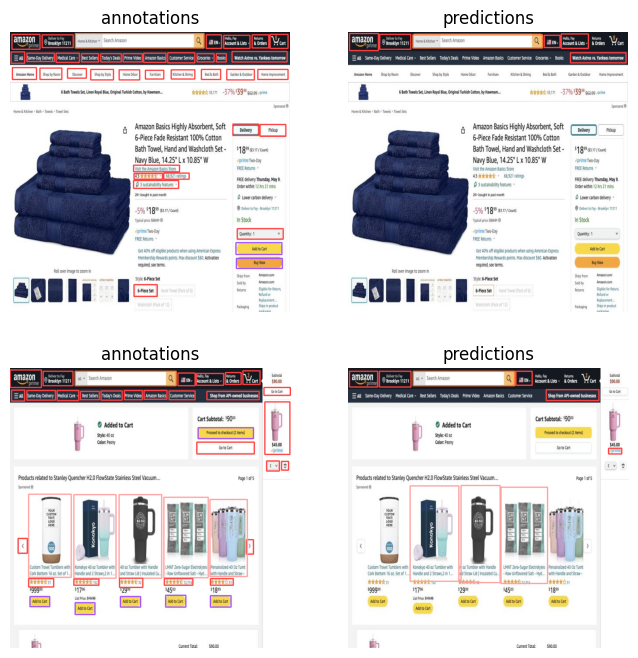

In [34]:
import supervision as sv

MAX_IMAGE_COUNT = 5

n = min(MAX_IMAGE_COUNT, len(ds.images))

keys = list(ds.images.keys())
keys = random.sample(keys, n)

box_annotator = sv.BoxAnnotator()

images = []
titles = []

for key in keys:
    frame_with_annotations = box_annotator.annotate(
        scene=ds.images[key].copy(),
        detections=ds.annotations[key],
        skip_label=True
    )
    images.append(frame_with_annotations)
    titles.append('annotations')
    frame_with_predictions = box_annotator.annotate(
        scene=ds.images[key].copy(),
        detections=predictions[key],
        skip_label=True
    )
    images.append(frame_with_predictions)
    titles.append('predictions')

%matplotlib inline
sv.plot_images_grid(images=images, titles=titles, grid_size=(n, 2), size=(2 * 4, n * 4))

### Calculate confusion matrix

In [36]:
!pip install -q onemetric

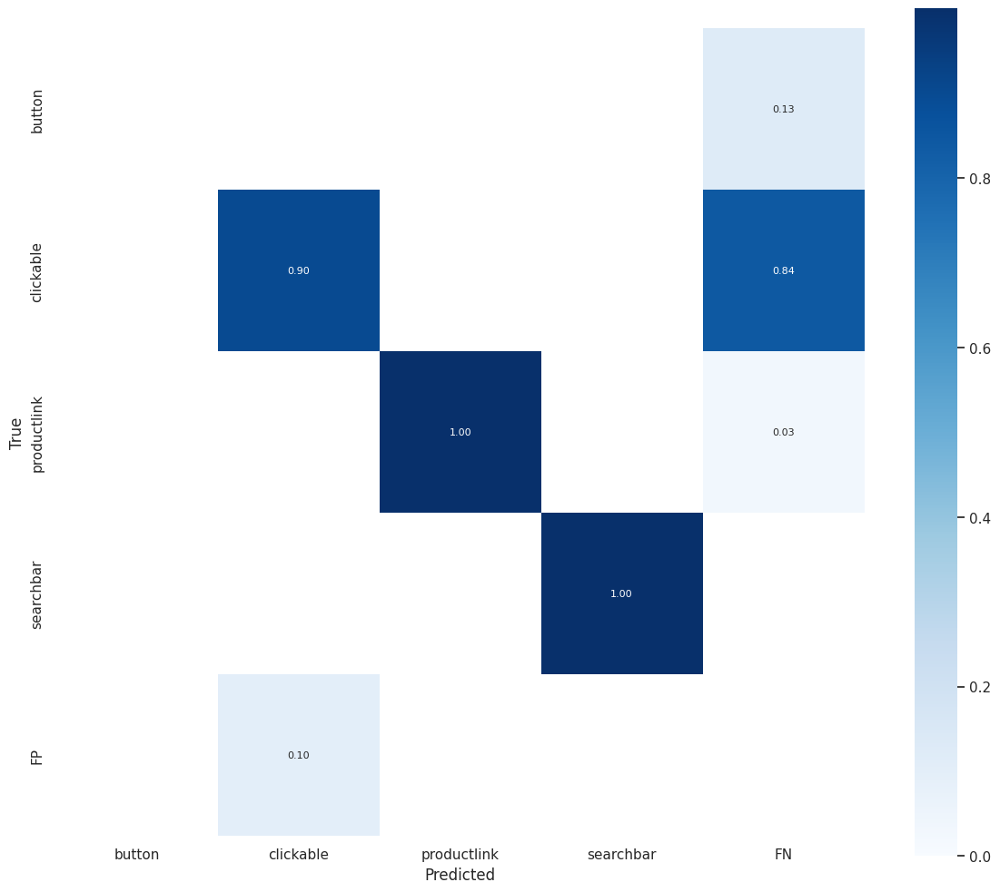

In [37]:
import os

import numpy as np

from onemetric.cv.object_detection import ConfusionMatrix

keys = list(ds.images.keys())

annotation_batches, prediction_batches = [], []

for key in keys:
    annotation=ds.annotations[key]
    annotation_batch = np.column_stack((
        annotation.xyxy,
        annotation.class_id
    ))
    annotation_batches.append(annotation_batch)

    prediction=predictions[key]
    prediction_batch = np.column_stack((
        prediction.xyxy,
        prediction.class_id,
        prediction.confidence
    ))
    prediction_batches.append(prediction_batch)

confusion_matrix = ConfusionMatrix.from_detections(
    true_batches=annotation_batches,
    detection_batches=prediction_batches,
    num_classes=len(ds.classes),
    conf_threshold=CONFIDENCE_TRESHOLD
)

confusion_matrix.plot(os.path.join(HOME, "confusion_matrix.png"), class_names=ds.classes)